In [2]:
%matplotlib inline

In [3]:
import geopandas as gp
import pandas as pd
import ast
import json
from shapely.geometry import Polygon
import matplotlib.pyplot as plt
import numpy as np
import mplleaflet

plt.rcParams['figure.figsize'] = 12, 8

Use this for analysis:

http://stackoverflow.com/questions/33440530/identify-unique-groupings-of-polygons-in-geopandas-shapely

## Notes

- Each of these polygons that are being read are unique.  The decoder has already separated entries with multiple polygons

###Read Geojson into geopandas

In [307]:
df = gp.read_file('../landfill_geojson.geojson')

In [308]:
# I believe this is the right crs... or at least the geometry
# area matches what was generated.
target_crs = {'datum':'NAD83',
              'ellps':'GRS80',
              'proj':'aea', 
              'units':'m'}

original_crs = df.crs # not sure what this is supposed to be

df = df.to_crs(crs=target_crs)

def clean_invalid(x):
    if not x.is_valid:
        return x.buffer(1)
    else:
        return x
        
df['geometry'] = df['geometry'].map(clean_invalid)

In [309]:
df.shape

(954, 14)

In [310]:
df.head()

,area,fac_name,fac_state,fac_street,geometry,id,task_id,task_run__created,task_run__finish_time,task_run__id,task_run__user_ip,task_runinfo__certain,task_runinfo__skip,task_user_id
0,74336.879239,AMERICAN DISPOSAL INC,RI,23 GREEN HILL RD,POLYGON ((-5360024.025299108 6565205.679392625...,OpenLayers_Feature_Vector_340,501701,2014-04-11T18:02:24.061996,2014-04-11T18:02:24.062013,629898,None,0,0,4038
1,8977.979795,AMERICAN DISPOSAL INC,RI,23 GREEN HILL RD,POLYGON ((-5360293.781678886 6565638.606944683...,OpenLayers_Feature_Vector_333,501701,2014-04-11T18:02:56.660754,2014-04-11T18:02:56.660769,629899,216.165.95.69,-1,0,None
2,1275812.214490,AMERICAN DISPOSAL INC,RI,23 GREEN HILL RD,POLYGON ((-5360483.654644775 6566644.210387644...,OpenLayers_Feature_Vector_316,501701,2014-04-11T18:03:09.583790,2014-04-11T18:03:09.583808,629900,None,1,0,5
3,300607.715762,ASTI WASTE SYSTEMS,CT,182-2 DANBURY RD,POLYGON ((-5492529.697411831 6653306.158498757...,OpenLayers_Feature_Vector_735,501703,2014-04-11T18:03:58.458460,2014-04-11T18:03:58.458477,629903,216.165.95.69,-1,0,None
4,1114961.938569,AMERICAN DISPOSAL INC,RI,23 GREEN HILL RD,POLYGON ((-5358970.960469259 6566938.148112121...,OpenLayers_Feature_Vector_521,501701,2014-04-11T18:03:58.556272,2014-04-11T18:03:58.556288,629904,216.165.95.70,-1,0,None


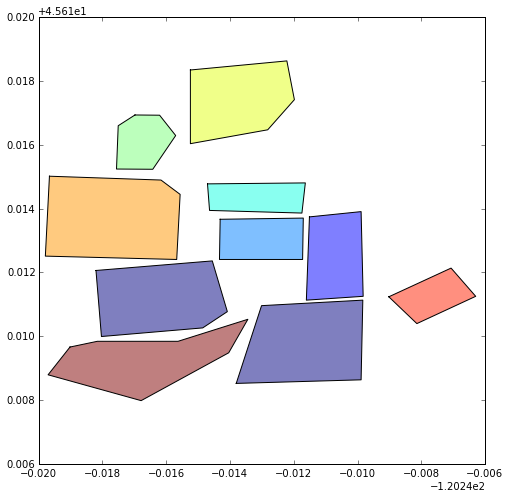

In [306]:
df[df['task_id'] == 502884].plot()

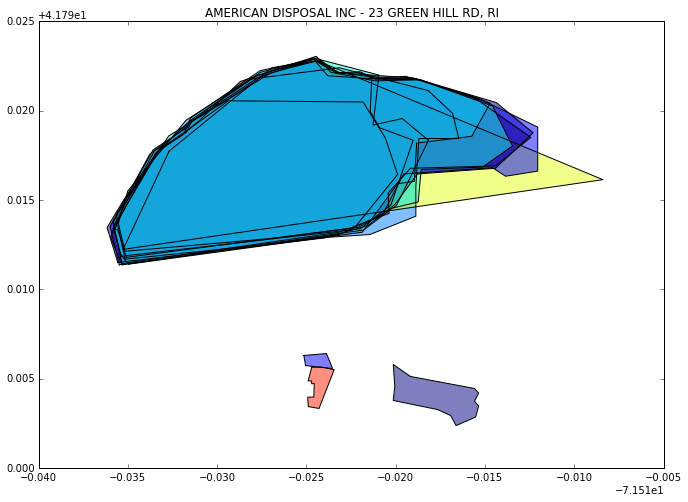

In [426]:
landfill = df[df['task_id'] == 501701]
landfill.plot()
title = landfill['fac_name'][0] + " - " + landfill['fac_street'][0] + ", " + landfill['fac_state'][0]
plt.title(title)
#plt.savefig('../plots/example_overlay.png', dpi=200)

---

## The Dumb Answer

In [ ]:
df.groupby(['task_id'])['area'].mean()

In [340]:
landfill_mean = df.groupby(['task_id'])['area'].mean()
total = landfill_mean.sum()

print 'Of all tasks presented, only %s landfills have at least one polygon. \n' %(len(landfill_mean))
print 'Sum Total Area of Landfills: {:,.2f} m \n'.format(total)

print 'Total Number of Unique Users: %s \n' %((df['task_user_id'].nunique() + df['task_run__user_ip'].nunique()))

print 'Largest Landfill: {:,.2f} m'.format(np.max(landfill_mean))
print 'Smallest Landfill: {:,.2f} m'.format(np.min(landfill_mean))
print 'Average Landfill Area: {:,.2f} m'.format(np.mean(landfill_mean))

Of all tasks presented, only 489 landfills have at least one polygon. 

Sum Total Area of Landfills: 325,043,952.50 m 

Total Number of Unique Users: 68 

Largest Landfill: 10,141,207.81 m
Smallest Landfill: 922.89 m
Average Landfill Area: 664,711.56 m


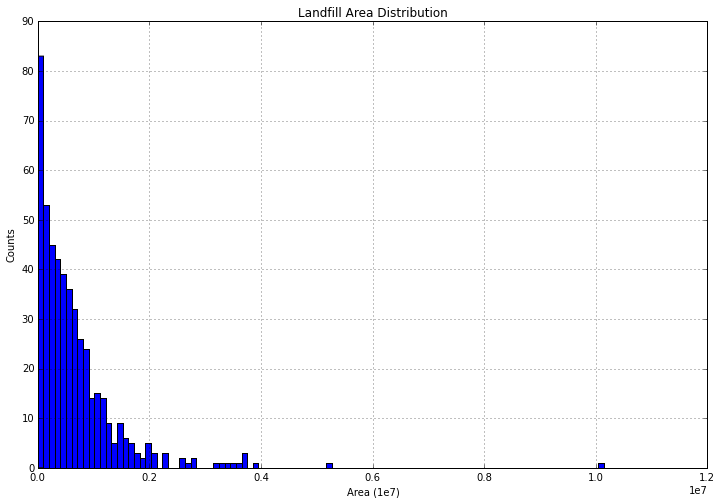

In [301]:
landfill_mean.hist(bins=100)
plt.title('Landfill Area Distribution')
plt.ylabel('Counts')
plt.xlabel('Area (1e7)')

## Working with multiple entries

In [372]:
# get the number of entries per task
task_len = df.groupby(['task_id']).size() 

# subset data if there is more than one entry
multiples_list = list(task_len[task_len > 1].reset_index()['task_id'])
multiples = df[df['task_id'].isin(multiples_list)]
non_multiples = df[~df['task_id'].isin(multiples_list)]

In [368]:
# Total Number of Polygons
print "Total number of tasks with polygons : %s" %(df.shape[0])
print "Total number of tasks with multiple polygons : %s" %(len(task_len[task_len > 1]))
print "Total number of tasks with only one polygon : %s" %(len(task_len[task_len == 1]))

Total number of tasks with polygons : 953
Total number of tasks with multiple polygons : 181
Total number of tasks with only one polygon : 308


/usr/local/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


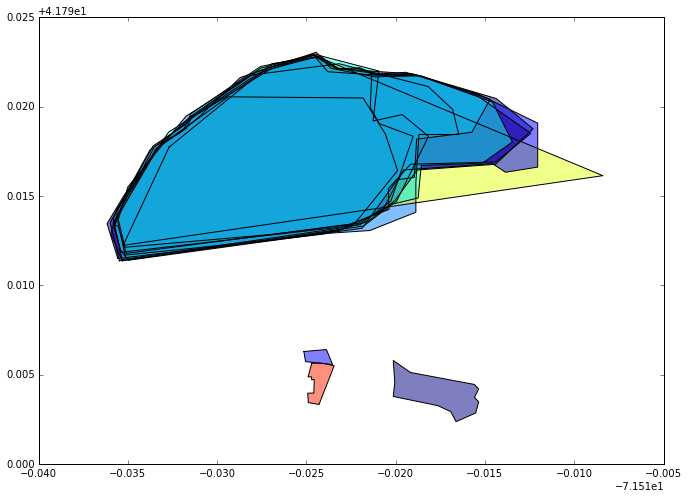

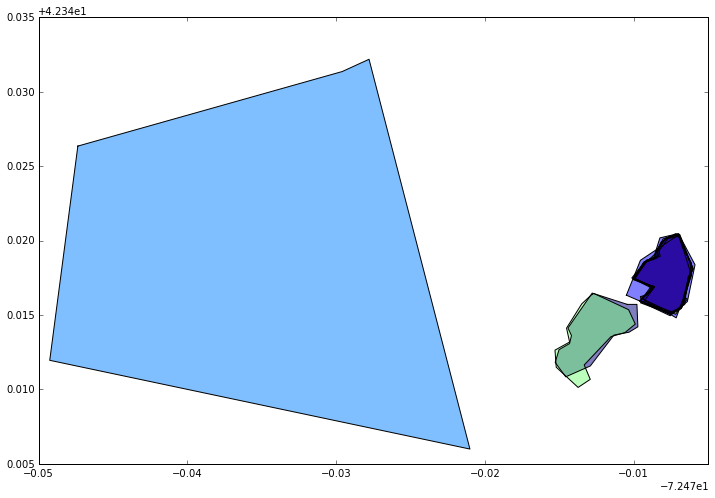

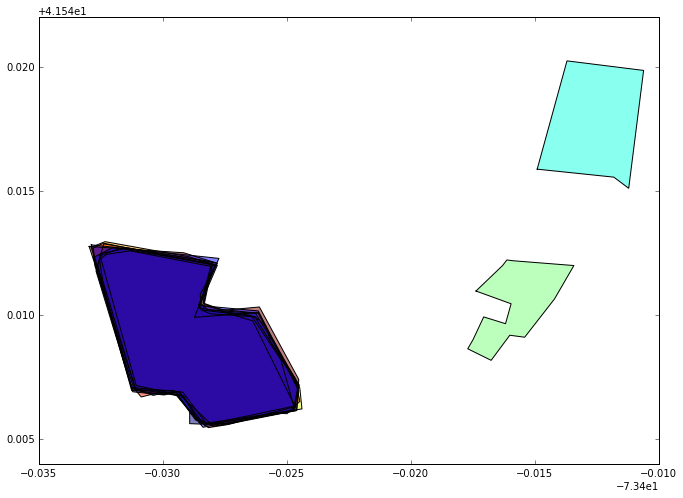

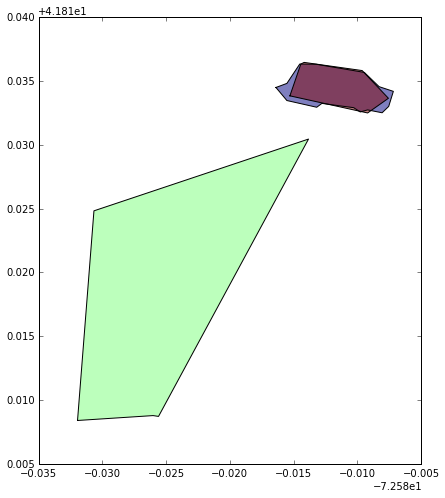

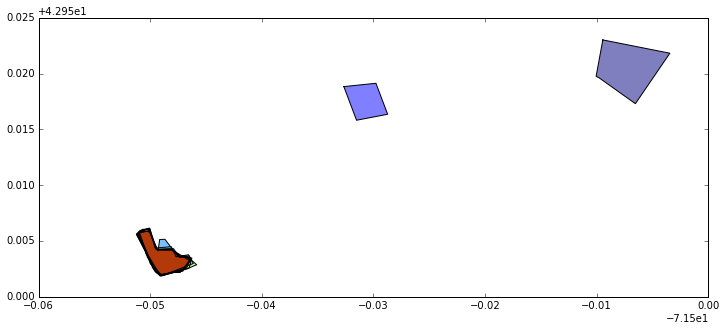

...

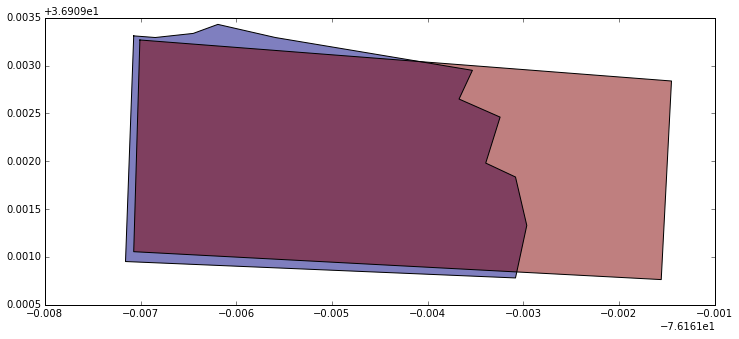

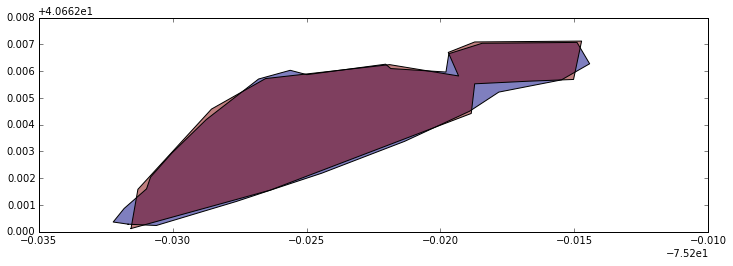

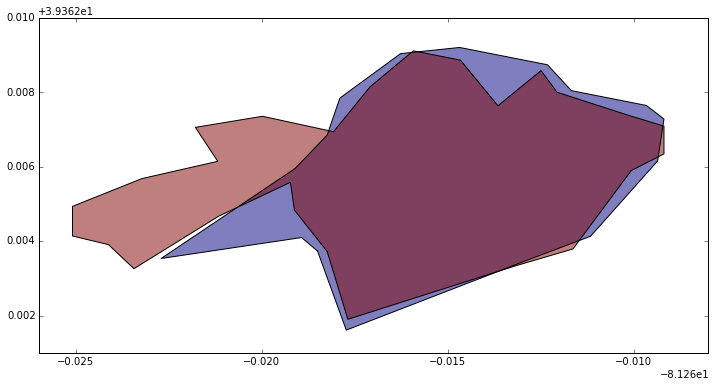

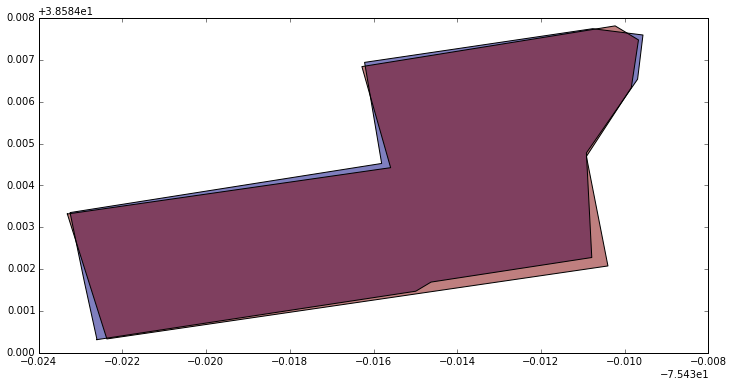

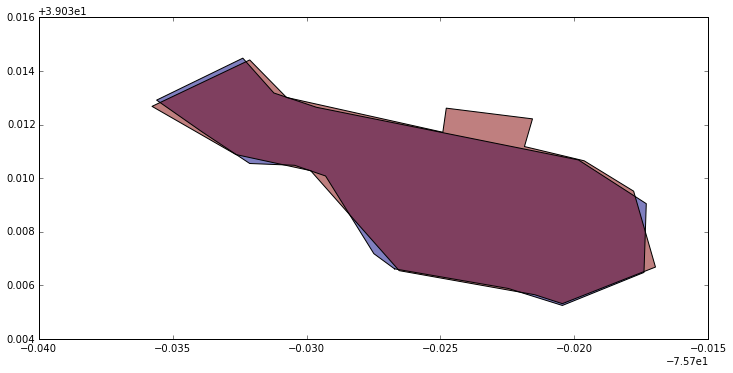

In [12]:
# Plot tasks with multiple entries
for ind, val in multiples.groupby('task_id'):
    val.plot()

In [9]:
def get_intersections(df):
    '''For each task_id group, create a list of indexes
    for landfills that intersect'''
    
    mask = {}
    for ind, val in df.iterrows():
        landfill = gp.GeoDataFrame(val)
        landfill['geometry'] = val['geometry']
        mask[ind] = []

        for ind1, val1 in df.iterrows():

            test_landfill = gp.GeoDataFrame(val1)
            test_landfill = val1['geometry']
            try:
                res = landfill.intersects(test_landfill)['task_id']
            except:
                print "Error on geoemtry: %s" %(ind1)
                
            if res:
                mask[ind].append(ind1)

    mask = [list(x) for x in set(tuple(x) for x in mask.values())]
    for i in mask:
        return i
    
#################################################

# mask are the indexes of landfill groups - ie landfills that intersect
mask = []
for ind, val in df.groupby(['task_id']):
    if len(val) > 1:
        mask.append(get_intersections(val))

### Stats about groups of landfills

In [305]:
print "Number of non-overlapping polygons from tasks with multiple entries: %s" %(len(mask))
print "Number of overlapping polygons from tasks with multiple entries: %s" %(45)

Number of non-overlapping polygons from tasks with multiple entries: 181
Number of overlapping polygons from tasks with multiple entries: 45


### How similar are peoples responses?

This is looking at the differences between entries based on **landfill area**

In [306]:
# Calculate descriptive stats for each group of landfills.  What is the
# average landfill area, max/min and std.

stats = {}
for landfill_groups in mask:
    ind = df.loc[landfill_groups]['task_id'].unique()[0]
    stats[ind] = {'max': None, 'min': None, 'mean': None, 'std': None}
    
    stats[ind]['max'] = df.loc[landfill_groups]['area'].max()
    stats[ind]['min'] = df.loc[landfill_groups]['area'].min()    
    stats[ind]['mean'] = df.loc[landfill_groups]['area'].mean()
    stats[ind]['std'] = df.loc[landfill_groups]['area'].std()    

In [307]:
stats = pd.DataFrame(stats).T
stats.loc[501711] = np.nan

In [308]:
# for all entries, how well did people do?
stats.describe()

,max,mean,min,std
count,180.000000,180.000000,180.000000,62.000000
mean,502872.123104,472794.348094,441177.470761,113047.728703
std,566908.906209,518669.116614,497659.303639,284727.866885
min,1422.174836,1422.174836,1422.174836,390.036810
25%,116184.102043,111096.925748,99321.660765,4480.811586
50%,339178.700636,321012.274831,260187.483081,16801.979390
75%,690213.235743,648328.396679,611589.127472,63707.579237
max,3701305.316815,2398669.215555,2398669.215555,1936198.225685


In [21]:
# The average std deviation percentage
p = stats[stats['std'].notnull()]
p['std_pct'] = (p['mean'] / p['std'])

/usr/local/lib/python2.7/site-packages/IPython/kernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [637]:
# The average std is 24 but the standard deviation of that average is 26... not so good
p['std_pct'].describe()

count     44.000000
mean      24.163967
std       26.827315
min        1.204529
25%        7.122000
50%       15.639167
75%       30.022158
max      133.478364
Name: std_pct, dtype: float64

                 max           mean            min           std
count      49.000000      49.000000      49.000000     49.000000
mean   239397.171331  229801.719310  219786.409632  11437.485977
std    229745.936658  224478.315738  219869.633065  12178.445969
min      3898.286807    3808.517042    3718.747278    126.953618
25%     73963.110349   71613.918730   64306.785908   2325.585925
50%    139648.819191  133190.497772  123362.583667   5593.630714
75%    376981.475959  363130.242423  335487.754538  19896.900020
max    835553.596553  830276.249336  824998.902119  45354.946379


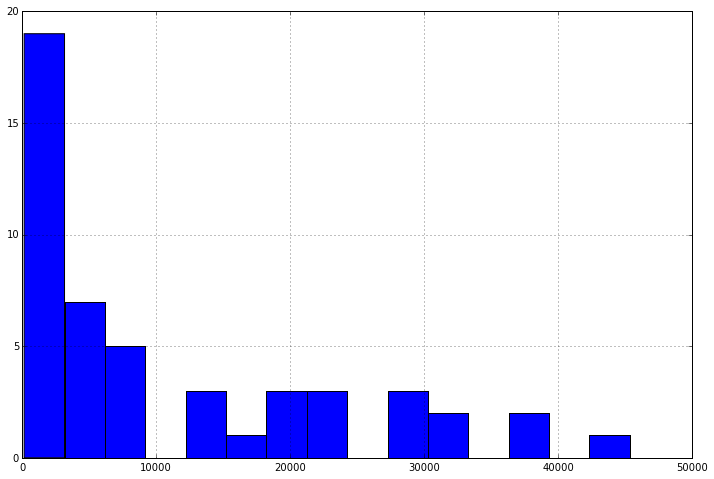

In [28]:
# distribution of standard deviations for each entry
t_stats = stats[stats['std'] < 50000]
print t_stats.describe()
t_stats['std'].hist(bins=15)

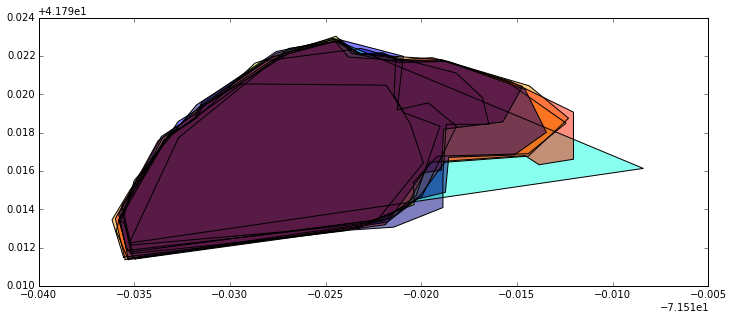

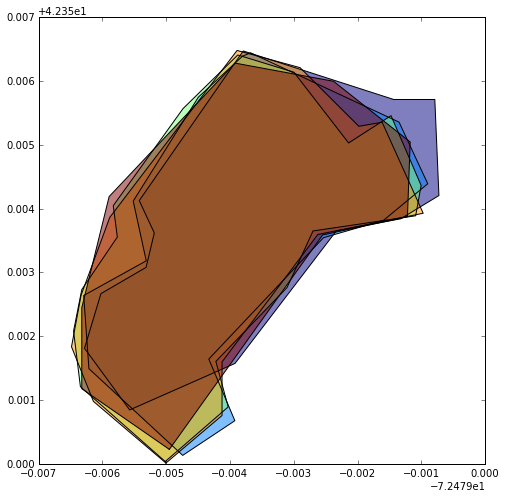

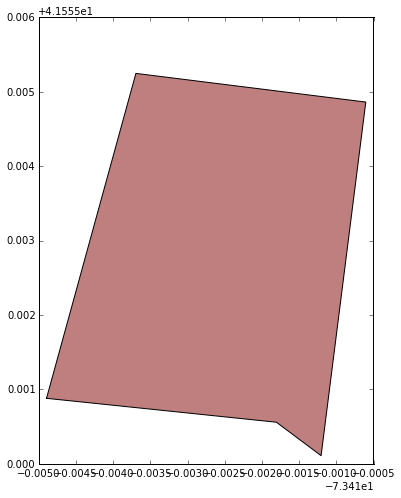

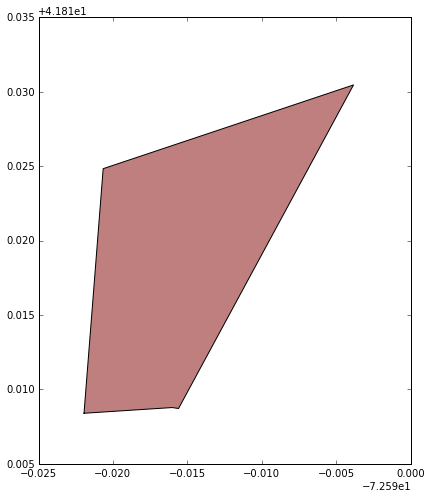

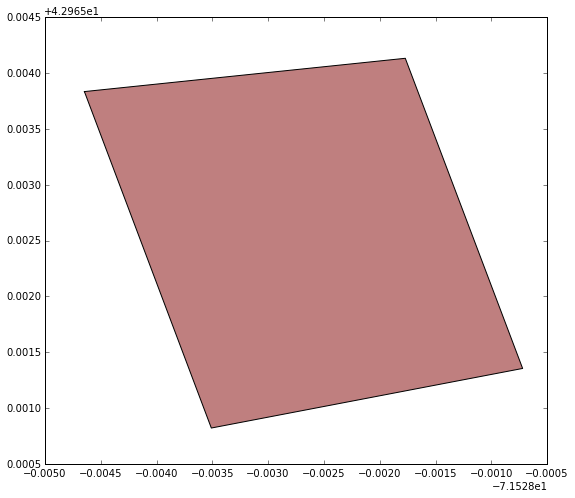

...

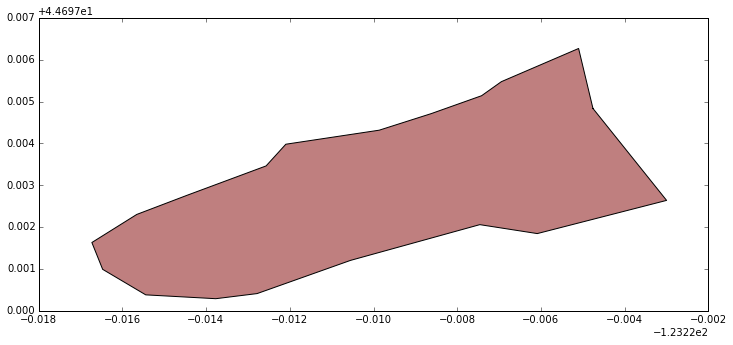

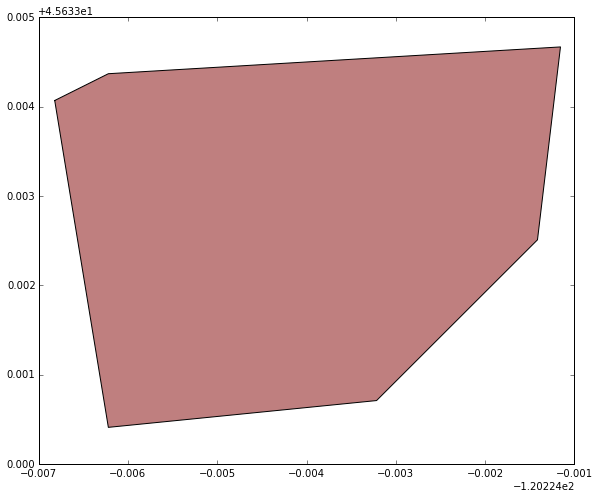

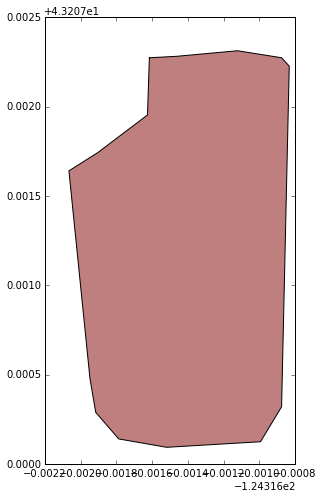

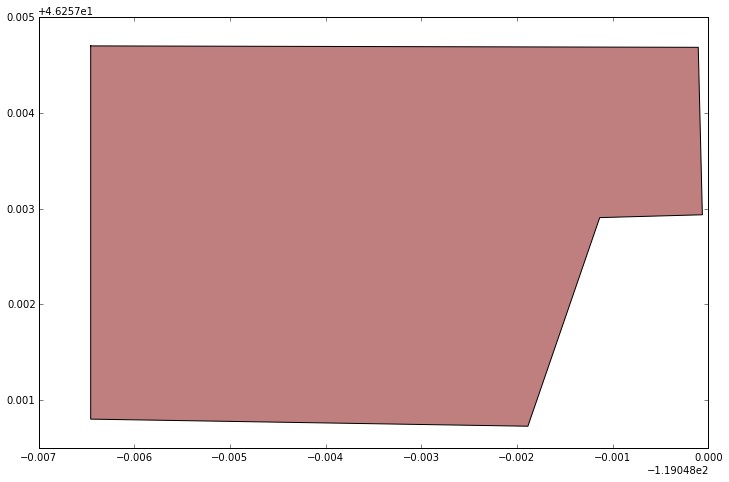

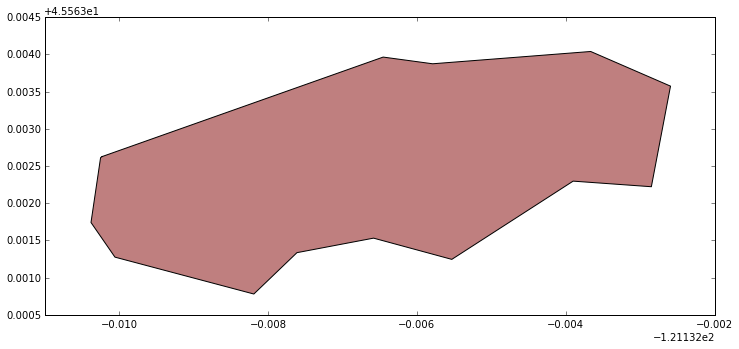

In [309]:
# plot only landfills that intersect
for landfill_groups in mask:
    df.loc[landfill_groups].plot()

In [374]:
# Overall average area for each entry
pd.pivot_table(df, index=['task_id'], values=['area'], aggfunc=np.mean).head()

,area
task_id,
501701,986141.856586
501702,394453.461883
501703,283684.851809
501704,749860.464495
501706,88660.680029


In [31]:
area_std = [[ind, val['area'].std() * 3] for ind, val in df.groupby(['task_id'])]
area_std = dict(area_std)

# TO DO:

- build features to train a bayesian model.  These could include, percent of landfills intersecting, number of points per polygon, area of the polygon, standard deviation, etc...

- Then, you should be able to give a probability of how accuract each landfill
- Calculate the percent overlap for multiple landfills instead of the standard deviation.  Then look at the distributions.  If the distribution is wide, then there is less confidence in the landfill.  If the distribution is narrow, there is a stronger confidence. This can then be used as a confidence score for the final landfill.

### Get number of points per polygon

In [310]:
df['number_of_points'] = df['geometry'].map(lambda x: len(x.array_interface_base['data']) / 2)

### Get confidence score for polygons which overlap

See bullet number three.

In [ ]:
# step one: get the intersection

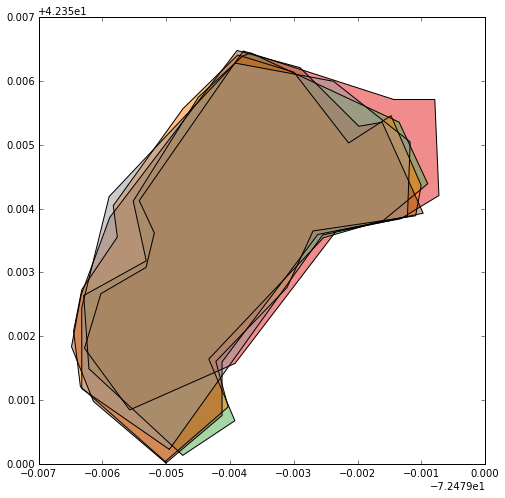

In [15]:
df.loc[mask[1]]['geometry'].plot()

In [314]:
# looping over groups and calculating the intersection and difference for each pair
def get_mean(x):
    '''Calculate the intersection and difference
    mean for each task'''
    
    rshp = len(x) / 4
    
    _ = pd.DataFrame(np.array(x).reshape(rshp,4), columns=['ind','compare_ind','intersection','difference'])
    _['intersection'] = _['intersection'].map(lambda x: np.round(x,2))
    _.drop_duplicates(subset=['intersection'], inplace=True)
    _ = _[_['ind'] != _['compare_ind']]

    return _['difference'].mean(), _['intersection'].mean()


diff = []
for group in mask:
    if len(group) > 1:
        overlay = []
        for ind, val in df.loc[group].iterrows():
            for ind1, val1 in df.loc[group].iterrows():
                overlay.append(ind)
                overlay.append(ind1)
                overlay.append(val['geometry'].intersection(val1['geometry']).area)
                overlay.append(val['geometry'].difference(val1['geometry']).area)

        diff_mean, inter_mean = get_mean(overlay)
        diff.append([diff_mean, inter_mean])

In [315]:
pd.DataFrame(diff)

,0,1
0,90602.437600,1118926.754545
1,11347.305420,137116.624000
2,34842.610129,180383.175278
3,NaN,NaN
4,67368.714048,104680.482000
5,3707.265355,21801.820000
6,6252.891644,150488.491000
7,2143.761466,74948.930000
8,13328.428665,76046.545778
9,34382.937946,260943.847778


## End Here

---

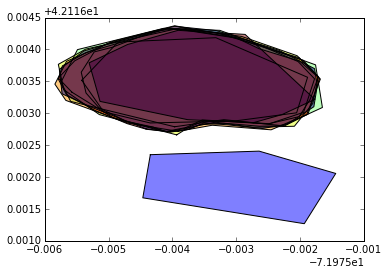

In [60]:
df[df['task_id'] == 501713].plot()

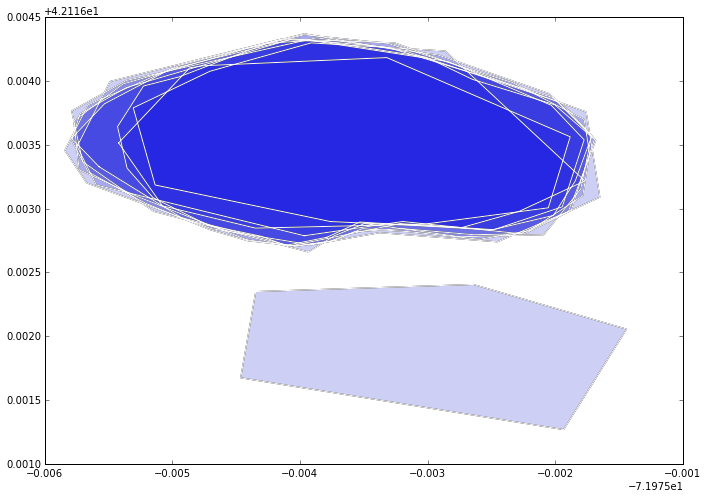

In [596]:
ax = df[df['task_id'] == 501713].plot()

for i in ax.patches:
    i.set_color("#111999")
    i.set_alpha(0.1)
    i.set_edgecolor("none")
#     i.set_linewidth(0)
#     i.set_joinstyle('bevel')
#     i.set_linestyle('dashed')


#ax.patches
for i in df[df['task_id'] == 501713]['geometry']:
    gp.plotting.plot_multipolygon(ax, i, alpha=0.1, facecolor='blue', edgecolor='white')
    
#edgecolor='white', alpha=0.1, facecolor='red', linewidth=0    


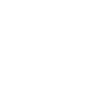

In [208]:
# show single geometry
df['geometry'][0]

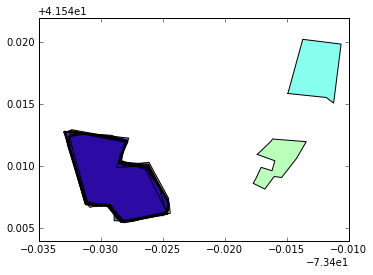

In [210]:
df[df['task_id'] == 501703].plot()
plt.show()

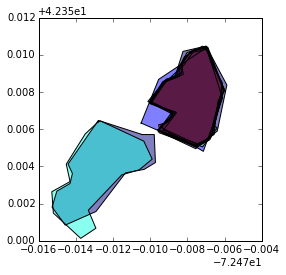

In [216]:
df[df['task_id'] == 501702][df['area'] < df['area'].std() * 3].plot()

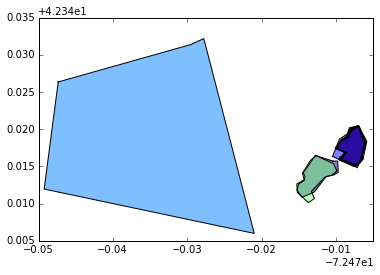

In [211]:
df[df['task_id'] == 501702].plot()
plt.show()

In [59]:
ax = df[df['task_id'] == 501713].plot()

mplleaflet.show(fig=ax.figure)

In [203]:
import mplleaflet
ax = lf.plot()
mplleaflet.show(fig=ax.figure)

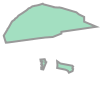

In [190]:
from shapely.ops import cascaded_union
cascaded_union(lf['geometry'])